In [1]:
import tifffile as tiff
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters import threshold_otsu
from scipy.ndimage import label, binary_fill_holes
from skimage.measure import regionprops
import cv2
import scipy.ndimage
from joblib import Parallel, delayed

In [2]:
def paint_binary_points(shape, points):
    # Create an empty image of the specified shape
    image = np.zeros(shape, dtype=np.uint8)

    # Iterate over the points
    for point in points:
        # Round the coordinates to the nearest integer
        y, x = tuple(int(round(coord)) for coord in point)
        # cv2.circle(image, (y,x), 5, (255), -1)
        # Draw the point on the image
        image[x, y] = 255

    return image.astype(np.uint8)


def find_rectangle_centers(image):
    # Ensure the image is binary
    assert np.array_equal(image, image.astype(bool)), "Image must be binary"

    # Find connected components in the image
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
        image.astype("uint8")
    )

    # The first component is the background, so ignore it
    return centroids[1:]


def find_brightest_ut(volume):
    # Find the brightest slice
    brightest_slice = np.argmax(np.sum(volume, axis=(0, 1)))
    return brightest_slice


def ut_preprocessing(ut):
    # get the frontwall slice id
    # frontwall = find_brightest_ut(ut)

    # get the frontwall slice
    ut_max_proj = np.max(ut[:, :, :], axis=2)
    plt.imshow(ut_max_proj)
    plt.title("Frontwall slice")
    plt.show()

    # otsu threshold
    thresh = threshold_otsu(ut_max_proj)
    binary = ut_max_proj > thresh
    plt.imshow(binary)
    plt.title("Binary image")
    plt.show()

    mask = binary_fill_holes(binary)

    inverted = np.invert(binary)
    plt.imshow(inverted)
    plt.title("Inverted image")
    plt.show()

    # onlypores to get the holes of the samples
    circles = np.logical_and(mask, inverted)
    plt.imshow(circles)
    plt.title("Only pores")
    plt.show()

    # now we label the onlypores to get only the 3 biggest ones

    # labeling
    labeled, _ = label(circles)

    # regionprops
    props = regionprops(labeled)

    # Step 1: Sort regions by area in descending order and get their labels
    sorted_regions = sorted(props, key=lambda x: x.area, reverse=True)
    largest_regions_labels = [region.label for region in sorted_regions[:3]]

    # Step 2: Create a new image to hold the result
    largest_regions_image = np.zeros_like(labeled)

    # Step 3: Fill in the three largest regions
    for lbl in largest_regions_labels:
        largest_regions_image[labeled == lbl] = lbl

    ut_centers = find_rectangle_centers(largest_regions_image > 0)

    centers_painted_ut = paint_binary_points(largest_regions_image.shape, ut_centers)

    return centers_painted_ut


def generate_circle_template(diameter_pixels):
    """
    Generate a binary circle template of given diameter in pixels.

    Args:
    - diameter_pixels (int): Diameter of the circle in pixels.

    Returns:
    - numpy.ndarray: Binary template with a circle.
    """
    radius = diameter_pixels // 2
    template_size = diameter_pixels + 2  # Add padding
    template = np.zeros((template_size, template_size), dtype=np.uint8)

    center = (template_size // 2, template_size // 2)
    cv2.circle(template, center, radius, 255, thickness=-1)  # Filled circle
    return template


def template_matching_find_holes(image, circle_diameter, resolution, top_n=3):
    """
    Find circular holes in an image using template matching.

    Args:
    - image (numpy.ndarray): Input image (2D array).
    - circle_diameter (float): Diameter of the circles in physical units (e.g., mm).
    - resolution (float): Resolution of the image in physical units per pixel (e.g., mm/pixel).
    - top_n (int): Number of holes to find (default is 3).

    Returns:
    - List of (x, y) tuples: Centroid positions of the detected holes.
    """
    # Step 1: Calculate the circle diameter in pixels
    diameter_pixels = int(circle_diameter / resolution)

    # Step 2: Generate the circle template
    template = generate_circle_template(diameter_pixels)

    # Step 3: Make a copy of the image for suppression
    image_copy = image.copy()

    # Step 4: Initialize list to store detected centroids
    detected_centroids = []
    suppression_radius = int(diameter_pixels / 2) + 1  # 1 pixel more than the radius

    # Step 5: Iteratively find matches and suppress detected regions
    for _ in range(top_n):
        # Perform template matching on the updated image copy
        result = cv2.matchTemplate(image_copy, template, cv2.TM_CCOEFF_NORMED)

        # Find the maximum value and its location
        _, max_val, _, max_loc = cv2.minMaxLoc(result)
        if max_val < 0.5:  # Ignore weak matches
            break

        # Append centroid (adjust for template offset)
        template_center = (template.shape[1] // 2, template.shape[0] // 2)
        centroid = (max_loc[0] + template_center[0], max_loc[1] + template_center[1])
        detected_centroids.append(centroid)

        # Suppress the area around the detected centroid in the image copy
        y_indices, x_indices = np.ogrid[: image_copy.shape[0], : image_copy.shape[1]]
        mask = (x_indices - centroid[0]) ** 2 + (
            y_indices - centroid[1]
        ) ** 2 <= suppression_radius**2
        image_copy[mask] = 0  # Set all pixels in the suppression zone to 0
    res = np.zeros_like(image)
    for centroid in detected_centroids:
        res[centroid[1], centroid[0]] = 255
    return res

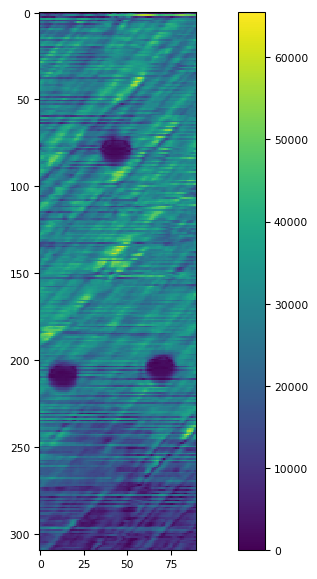

(310, 90, 352)

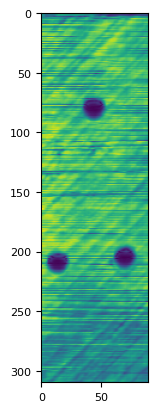

In [3]:
vol_ut = tiff.imread(
    r"C:\Users\jorge.cabrejas\Desktop\bin2mat ITEFI\P1P29_15MHZ_L_24E_17DB_RF_01_amplitude_16b_resized.tif"
)
vol_ut = np.swapaxes(vol_ut, 0, 1)
vol_ut = np.swapaxes(vol_ut, 1, 2)
tiff.imshow(vol_ut[:, :, 85])
plt.show()
brightest_slice = np.argmax(np.sum(vol_ut, axis=(0, 1)))
plt.imshow(vol_ut[:, :, brightest_slice])
vol_ut.shape

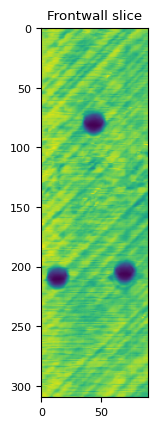

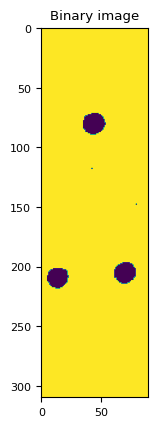

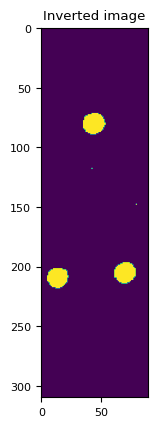

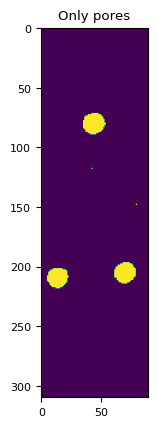

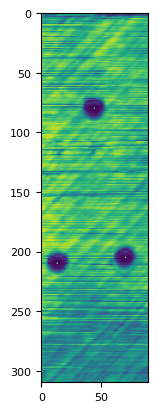

In [4]:
painted = ut_preprocessing(vol_ut)
# Show interactively the slices of the volume using ipywidgets
a = vol_ut[:, :, brightest_slice].copy()
a[painted > 0] = 65535
plt.imshow(a)
tiff.imwrite("pots.tif", a)

In [5]:
def calculate_new_dimensions(original_resolution, new_resolution, original_dimensions):
    # Calculate the original dimensions in real-world units
    original_width, original_height = original_dimensions
    real_world_width = original_width * original_resolution
    real_world_height = original_height * original_resolution

    # Calculate the new dimensions in pixels
    new_width = int(real_world_width / new_resolution)
    new_height = int(real_world_height / new_resolution)

    return new_width, new_height


def resize_image(original_image, size, show=False):
    width, height = original_image.size
    if show:
        print(f"The original image size is {width} wide x {height} tall")

    resized_image = original_image.resize(size)
    width, height = resized_image.size
    if show:
        print(f"The resized image size is {width} wide x {height} tall")
    return np.array(resized_image)


def xct_preprocessing(xct, original_resolution=0.025, new_resolution=1):
    # get the max projection of the xct so the holes are visible
    max_proj = np.max(xct, axis=2)

    # resize the brightest to UT resolution
    original_dimensions = (xct.shape[0], xct.shape[1])
    new_dimensions = calculate_new_dimensions(
        original_resolution, new_resolution, original_dimensions
    )

    # segment and get onlypores to get only the holes
    thresh = threshold_otsu(max_proj)
    binary = max_proj > thresh

    mask = binary_fill_holes(binary)

    inverted = np.invert(binary)

    circles = np.logical_and(mask, inverted)

    circles = resize_image(Image.fromarray(circles), new_dimensions[::-1])

    xct_centers = find_rectangle_centers(circles)

    centers_painted_xct = paint_binary_points(circles.shape, xct_centers)

    return centers_painted_xct

(<Figure size 988.8x604.8 with 2 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x1227f994350>)

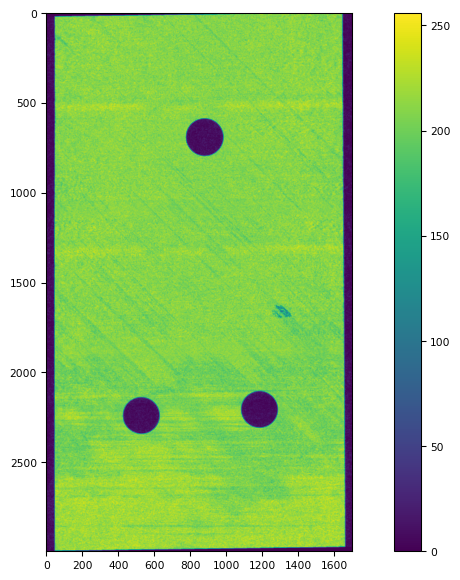

In [6]:
vol_xct = tiff.imread(
    r"C:\Users\jorge.cabrejas\Desktop\bin2mat ITEFI\frontal_90right_1_29.tif"
)
vol_xct = np.swapaxes(vol_xct, 0, 1)
vol_xct = np.swapaxes(vol_xct, 1, 2)
tiff.imshow(vol_xct[:, :, 85])

Text(0.5, 1.0, 'UT')

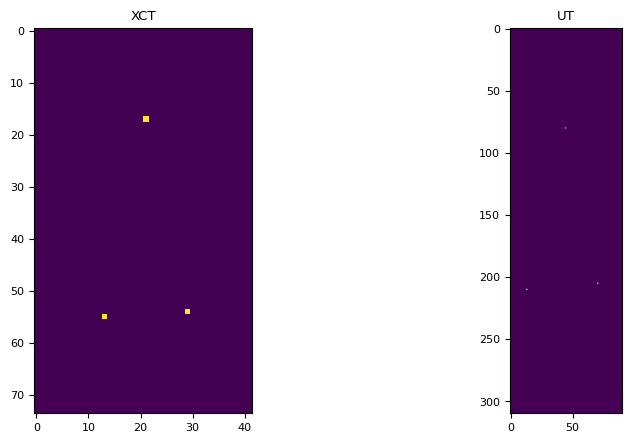

In [7]:
painted_xct = xct_preprocessing(vol_xct)
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(painted_xct)
ax[0].set_title("XCT")
ax[1].imshow(painted)
ax[1].set_title("UT")

In [8]:
def label_objects(image):
    labeled_image, num_features = label(image)
    output_image = np.zeros_like(image)

    indices = np.where(labeled_image > 0)
    indices = list(zip(indices[0], indices[1]))

    # Label the object nearest to the top edge
    top_object = min(indices, key=lambda x: x[0])
    output_image[top_object] = 100
    indices.remove(top_object)

    if indices:
        # Label the object nearest to the left edge
        left_object = min(indices, key=lambda x: x[1])
        output_image[left_object] = 175
        indices.remove(left_object)

    # Label the remaining objects
    for idx in indices:
        output_image[idx] = 255

    return output_image


def extract_points(
    image,
):  # given a labeled points image, returns the list of points in it x,y,value
    points = []
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if image[i, j] > 0:
                points.append([i, j, image[i, j]])
    return np.array(points)


def rigid_body_transformation_matrix(points_A, points_B):
    """
    Calculate the rigid body transformation matrix to convert points_B to points_A.

    Args:
    points_A (numpy.ndarray): A Nx2 array of points.
    points_B (numpy.ndarray): A Nx2 array of points.

    Returns:
    numpy.ndarray: A 3x3 transformation matrix.
    """

    # Compute the centroids of both sets of points
    centroid_A = np.mean(points_A, axis=0)
    centroid_B = np.mean(points_B, axis=0)

    # Center the points by subtracting the centroids
    centered_A = points_A - centroid_A
    centered_B = points_B - centroid_B

    # Compute the covariance matrix
    H = np.dot(centered_B.T, centered_A)

    # Perform Singular Value Decomposition (SVD)
    U, S, Vt = np.linalg.svd(H)

    # Compute the rotation matrix
    R = np.dot(Vt.T, U.T)

    # Ensure a right-handed coordinate system
    if np.linalg.det(R) < 0:
        Vt[-1, :] *= -1
        R = np.dot(Vt.T, U.T)

    # Compute the translation vector
    t = centroid_A - np.dot(R, centroid_B)

    # Construct the transformation matrix
    transformation_matrix = np.eye(3)
    transformation_matrix[:2, :2] = R
    transformation_matrix[:2, 2] = t

    return transformation_matrix


def scale_transformation_matrix(transformation_matrix, scale_factor):
    """
    Scale a 2D rigid body transformation matrix.

    Args:
    transformation_matrix (numpy.ndarray): A 3x3 transformation matrix.
    scale_factor (float): Scaling factor.

    Returns:
    numpy.ndarray: A 3x3 scaled transformation matrix.
    """

    # Construct the scaling matrix
    scaled_transformation_matrix = transformation_matrix.copy()

    scaled_transformation_matrix[:2, 2] *= scale_factor

    return scaled_transformation_matrix


def main_2(ut, xct, ut_resolution=0.3, circle_diameter_mm=5):
    print("Preprocessing")
    # print(ut.shape)
    ut_ = ut.copy()
    ut_ = ((ut_ - ut_.min()) / (ut_.max() - ut_.min()) * 255).astype(np.uint8)
    ut_ = 255 - np.max(ut_, axis=2)
    # print(ut_.shape)
    # plt.imshow(ut_)
    ut_centers = label_objects(
        template_matching_find_holes(ut_, circle_diameter_mm, ut_resolution)
    )

    xct_centers = label_objects(
        xct_preprocessing(xct, original_resolution=0.025, new_resolution=0.3)
    )

    # extract the points from the images
    ut_points = extract_points(ut_centers)
    xct_points = extract_points(xct_centers)

    sorted_indices_ut = np.argsort(ut_points[:, -1])
    sorted_indices_xct = np.argsort(xct_points[:, -1])

    # Use these indices to sort the original array
    sorted_ut_points = ut_points[sorted_indices_ut]
    sorted_xct_points = xct_points[sorted_indices_xct]

    # check if there are at least 2 points
    if len(sorted_ut_points) < 3:
        print("Not enough UT points")
        raise ValueError("Not enough UT points")

    if len(sorted_xct_points) < 3:
        print("Not enough XCT points")
        raise ValueError("Not enough XCT points")

    # check if there are the same number of points
    if len(sorted_ut_points) != len(sorted_xct_points):
        print("Different number of points")
        raise ValueError("Different number of points")

    print("Preprocessed")

    print("Registering")

    transformation_matrix = rigid_body_transformation_matrix(
        sorted_xct_points[:, :2], sorted_ut_points[:, :2]
    )
    scaled_transformation_matrix = scale_transformation_matrix(
        transformation_matrix, 0.3 / 0.025
    )

    print("Registered")

    parameters = scaled_transformation_matrix

    return parameters


def apply_transform_parameters_paralel(matrix, ut, xct, original_resolution=0.025):
    big_shape = calculate_new_dimensions(0.3, original_resolution, ut.shape[:2])

    def func(slice, matrix, shape):
        # Apply affine transform to the current slice
        return scipy.ndimage.affine_transform(slice, matrix, output_shape=shape)

    # Create the function to apply on each slice
    def process_slice(z, volume, matrix, shape):
        current_slice = volume[:, :, z]  # Extract the (X, Y) slice
        return func(current_slice, matrix, shape)  # Apply the transformation

    # Use joblib's Parallel to apply the function concurrently with a progress bar
    n_jobs = -1  # Use all available cores
    n_slices = xct.shape[2]  # Number of slices in the Z dimension

    # Use tqdm for progress bar
    transformed_slices = Parallel(n_jobs=n_jobs)(
        delayed(process_slice)(z, xct, matrix[:2, :], big_shape)
        for z in range(n_slices)
    )

    # Reassemble the transformed slices into the final 3D array
    transformed_volume = np.stack(transformed_slices, axis=2)

    return transformed_volume


def apply_registration(ut, xct, parameters):  # (X,Y,Z) axes
    transformation_matrix = parameters

    print("Applying transformation")

    transformed_volume = apply_transform_parameters_paralel(
        transformation_matrix, ut, xct
    )

    print("Transformation applied")

    return transformed_volume

Preprocessing
Preprocessed
Registering
Registered
Applying transformation
Transformation applied


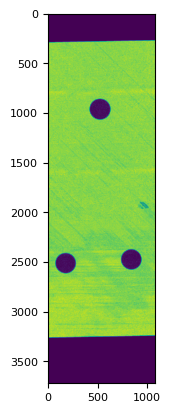

In [9]:
p = main_2(vol_ut, vol_xct)
registered = apply_registration(vol_ut, vol_xct, p)
plt.imshow(registered[:, :, 85])

In [10]:
import numpy as np
from skimage.transform import resize


def resize_3d_volume_xy(
    volume, original_resolution, new_resolution, interpolation_order=1
):
    """
    Resize a 3D volume in the XY plane to a new resolution while keeping the Z axis unchanged.

    Parameters:
    - volume (numpy.ndarray): Input 3D volume with shape (X, Y, Z).
    - original_resolution (float): Current resolution in the XY plane (e.g., mm per pixel).
    - new_resolution (float): Desired resolution in the XY plane (e.g., mm per pixel).
    - interpolation_order (int): Order of the interpolation (default is 1 - linear).

    Returns:
    - numpy.ndarray: Resized 3D volume with new XY resolution.
    """
    # Calculate the scaling factor for XY axes
    scaling_factor = original_resolution / new_resolution

    # Get the new dimensions for the XY axes
    original_shape_xy = volume.shape[:2]
    new_shape_xy = tuple(int(dim * scaling_factor) for dim in original_shape_xy)

    # Resize each Z-slice in the XY plane
    resized_volume = np.stack(
        [
            resize(
                volume[:, :, z],
                new_shape_xy,
                order=interpolation_order,
                mode="reflect",
                anti_aliasing=True,
            )
            for z in range(volume.shape[2])
        ],
        axis=2,
    )

    return resized_volume

In [11]:
# registered = resize_3d_volume_xy(registered, 0.025, 0.3)

registered = resize_3d_volume_xy(registered, 0.025, 0.3)
registered = (
    ((registered - registered.min()) / (registered.max() - registered.min())) * 255
).astype(np.uint8)
print(f"Final shape: {registered.shape}")
import os
from tqdm import tqdm

os.makedirs("registered", exist_ok=True)
for i in tqdm(range(registered.shape[2])):
    slice_ = registered[:, :, i]
    tiff.imwrite(f"registered/slice_{i}.tif", slice_)

Final shape: (310, 90, 300)


100%|██████████| 300/300 [00:00<00:00, 887.31it/s]


In [12]:
volume = tiff.imread(
    r"C:\Users\jorge.cabrejas\Desktop\bin2mat ITEFI\P1P29_15MHZ_L_24E_17DB_RF_01_amplitude_16b_resized.tif"
)
zdim, ydim, xdim = volume.shape

# Define the target index where all maxima should be aligned


# Find the index of the maximum along the z-axis for each (y, x) position
max_indices = np.argmax(volume, axis=0)  # Shape: (ydim, xdim)
target_index = np.median(max_indices).astype(int)

# Calculate shifts needed to align maxima to the target index
shifts = target_index - max_indices  # Shape: (ydim, xdim)

# Initialize variables to determine the cropping bounds
min_start = 0
max_end = zdim

# Find cropping bounds based on the shortest signal after alignment
for y in range(ydim):
    for x in range(xdim):
        # Calculate the new start and end indices for the signal after shifting
        start = max(0, -shifts[y, x])
        end = min(zdim, zdim - shifts[y, x])

        # Update global bounds for cropping
        min_start = max(min_start, start)
        max_end = min(max_end, end)

# Crop and align the volume
aligned_cropped_volume = np.zeros((max_end - min_start, ydim, xdim), dtype=volume.dtype)

for y in range(ydim):
    for x in range(xdim):
        # Shift the signal and crop to the determined bounds
        shifted_signal = np.roll(volume[:, y, x], shifts[y, x])
        aligned_cropped_volume[:, y, x] = shifted_signal[min_start:max_end]

# Verify the result
print("Original volume shape:", volume.shape)
print("Aligned and cropped volume shape:", aligned_cropped_volume.shape)

# Check that all maxima are aligned to the target index within the cropped volume
aligned_max_indices = np.argmax(aligned_cropped_volume, axis=0)
print(
    "All maxima aligned to target index:",
    np.all(aligned_max_indices == target_index - min_start),
)

Original volume shape: (352, 310, 90)
Aligned and cropped volume shape: (336, 310, 90)
All maxima aligned to target index: True


Original shape: (310, 90, 300)
Resampled shape: (310, 90, 8)


  0%|          | 0/336 [00:00<?, ?it/s]c:\Users\jorge.cabrejas\.conda\envs\register\Lib\site-packages\numpy\lib\_function_base_impl.py:2999: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\jorge.cabrejas\.conda\envs\register\Lib\site-packages\numpy\lib\_function_base_impl.py:3000: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
100%|██████████| 336/336 [00:15<00:00, 22.01it/s]


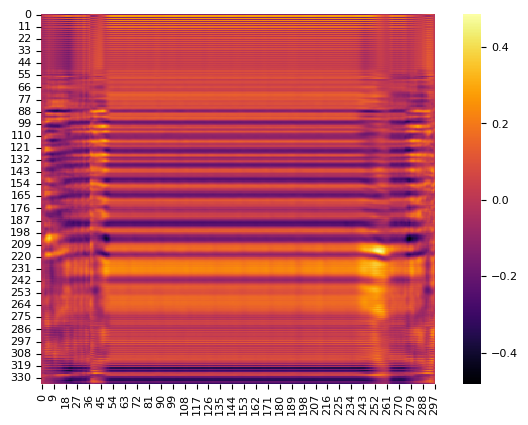

Mean correlation over all slices: nan
Mean correlation over positive correlated slices all slices: 0.08479966445823432
Mean correlation over positive correlated (> 0.2) slices all slices: 0.15553609925155054
Positive correlated slices: 59061 - Total slices: 100800
Max correlation nan - Min correlation nan


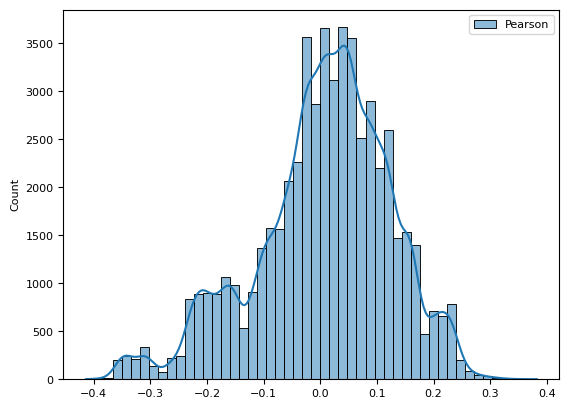

In [13]:
from scipy.ndimage import zoom

corrs = []

# Original and target z-resolutions
original_z_resolution = 0.025  # e.g., 0.025 mm
target_z_resolution = 1.0  # e.g., 1 mm

# Calculate scaling factor for z
scaling_factor_z = original_z_resolution / target_z_resolution

# Apply zoom only along z, keep x and y the same
scaling_factors = [1, 1, scaling_factor_z]  # [z, y, x]

# Resample the volume
reg_resized_z = zoom(registered, scaling_factors, order=1)  # Linear interpolation
spearman = []
# Output shapes for verification
print("Original shape:", registered.shape)
print("Resampled shape:", reg_resized_z.shape)
aligned_cropped_volume = np.swapaxes(aligned_cropped_volume, 0, 1)
aligned_cropped_volume = np.swapaxes(aligned_cropped_volume, 1, 2)

for i in tqdm(range(aligned_cropped_volume.shape[2])):
    _corr = []
    _sp = []
    for j in range(registered.shape[2]):
        _corr.append(
            float(
                np.corrcoef(
                    aligned_cropped_volume[:, :, i].ravel(), registered[:, :, j].ravel()
                )[0, 1]
            )
        )
        # res = spearmanr(aligned_cropped_volume[:, :, i].ravel(), registered[:, :, j].ravel())
        # st, p = res.statistic, res.pvalue
        # _sp.append(st)
    corrs.append(_corr)
    # spearman.append(_sp)

corrs = np.array(corrs)
# spearman = np.array(spearman)
import seaborn as sns

sns.heatmap(corrs, cmap="inferno")
plt.show()

# sns.heatmap(spearman, cmap='inferno')
# plt.show()
print(f"Mean correlation over all slices: {corrs.mean()}")

print(
    f"Mean correlation over positive correlated slices all slices: {corrs[corrs > 0].mean()}"
)
print(
    f"Mean correlation over positive correlated (> 0.2) slices all slices: {corrs[corrs > 0.1].mean()}"
)
# Plot the histogram of correlations over the lower triangle of corrs matrix with sns
sns.histplot(
    corrs[np.tril_indices_from(corrs, k=-1)], bins=50, kde=True, label="Pearson"
)
# sns.histplot(spearman[np.tril_indices_from(spearman, k=-1)], bins=50, kde=True, label='Spearman')
plt.legend()
print(f"Positive correlated slices: {np.sum(corrs > 0)} - Total slices: {corrs.size}")
print(f"Max correlation {corrs.max()} - Min correlation {corrs.min()}")
# print(f"Max correlation {spearman.max()} - Min correlation {spearman.min()}")

In [14]:
# Example inputs
image = tiff.imread(
    r"C:\Users\jorge.cabrejas\Desktop\bin2mat ITEFI\P1P29_15MHZ_L_24E_17DB_RF_01_amplitude_16b.tif"
)
image = np.swapaxes(image, 0, 1)
image = np.swapaxes(image, 1, 2)
image = (image - image.min()) / (image.max() - image.min())
image = (image * 255).astype(np.uint8)
image = 255 - np.max(image, axis=2)

circle_diameter_mm = 5  # Circle diameter in mm
resolution_mm_per_pixel = 0.3  # Image resolution in mm/pixel

# Detect centroids of the holes
centroids = template_matching_find_holes(
    image, circle_diameter_mm, resolution_mm_per_pixel
)

# Paint the detected centroids on the image
output_image = paint_centroids_on_image(image, centroids)

# Display the results
import matplotlib.pyplot as plt

plt.imshow(output_image)
plt.title("Detected Centroids")
plt.axis("off")
plt.show()

# Print detected centroids
print("Detected centroids:", centroids)

NameError: name 'paint_centroids_on_image' is not defined

[5 3 5 3 5 5 5 5 5 5 5 6 6 6 6 6 5 6 5 6 0 6 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 6 5 3 2 0 0 0 0 0 0
 0 0 0 0 0 0 5 5 5 7 6 6 7 7 7 7 7 0 0 3 3 1 0 5 5 6 6 5 5 5 5 4 4 1 1 0 0
 0 0 1 0 0 7 7 6 3 3 2 2 2 3 3 0 0 3 4 4 4 3 3 2 0 0 3 3 2 1 0 0 0 3 3 3 2
 0 0 0 0 2 1 1 0 5 6 6 6 6 0 0 0 3 3 2 3 3 3 3 3 3 3 3 0 0 0 0 0 6 6 6 6 6
 6 6 0 0 0 0 0 0 0 0 0 2 6 6 6 6 6 6 0 0 0 6 6 6 6 6 6 6 5 5 5 5 5 5 2 1 1
 1 5 5 5 5 5 5 5 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 1 1 1 1 1 1 1 1
 1 1 0 0 5 5 5 5 4 4 4 4 4 4 4 5 5 5 5 5 5 4 4 4 4 4 4 5 5 5 5 5 4 4 4 0 0
 0 0 0 0 4 4 4 5 5 5 5 5 5 5 5 5 5 5 4 4 4 3 4 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 6 5 5]


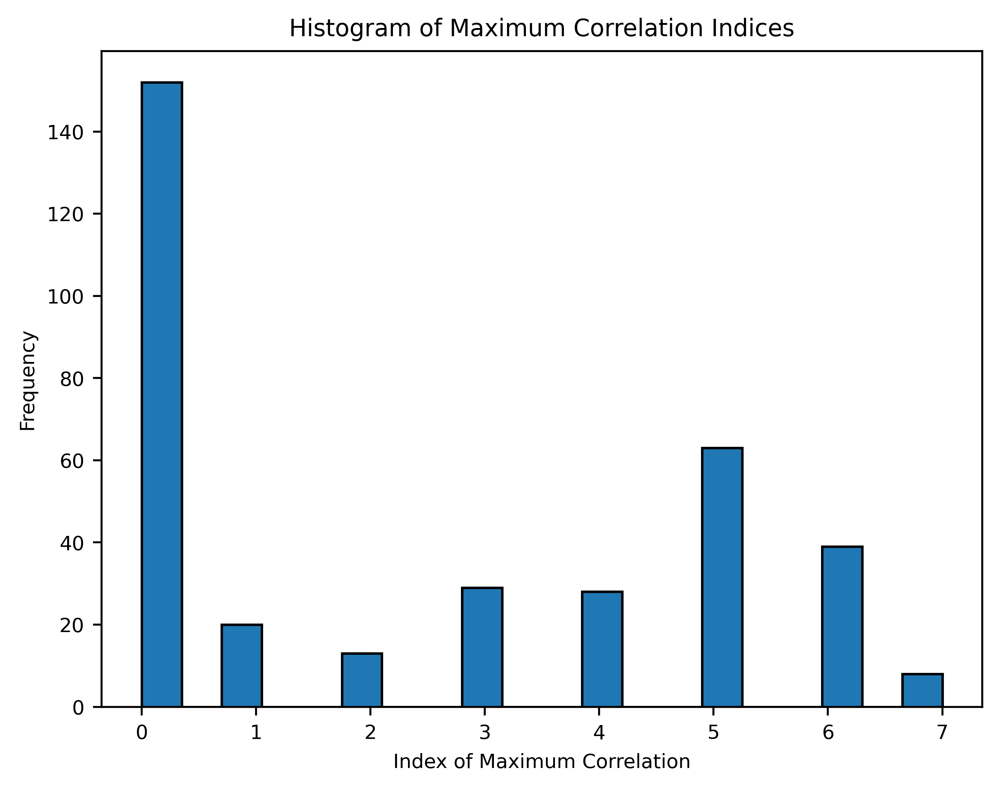

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Find the index of the maximum correlation for each row
max_corr_indices = np.argmax(corrs, axis=1)

# Print the array of indices
print(max_corr_indices)

# Plot the histogram of max_corr_indices
plt.hist(max_corr_indices, bins=20, edgecolor="black")
plt.xlabel("Index of Maximum Correlation")
plt.ylabel("Frequency")
plt.title("Histogram of Maximum Correlation Indices")
plt.show()

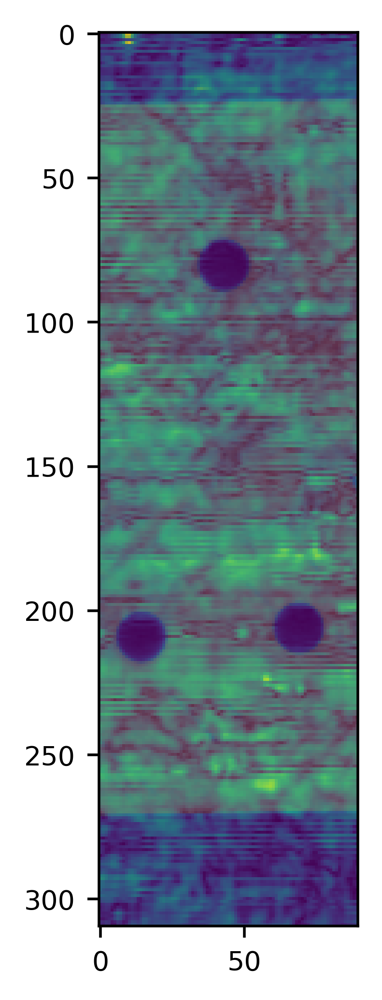

In [ ]:
plt.imshow(vol_ut[:, :, 120])
plt.imshow(registered[:, :, 150], alpha=0.2)

In [ ]:
r.shape

NameError: name 'r' is not defined

In [ ]:
vol_ut.shape, registered.shape

((310, 105, 352), (310, 105, 300))

In [ ]:
def generate_circle_template(diameter_pixels):
    """
    Generate a binary circle template of given diameter in pixels.

    Args:
    - diameter_pixels (int): Diameter of the circle in pixels.

    Returns:
    - numpy.ndarray: Binary template with a circle.
    """
    radius = diameter_pixels // 2
    template_size = diameter_pixels + 2  # Add padding
    template = np.zeros((template_size, template_size), dtype=np.uint8)

    center = (template_size // 2, template_size // 2)
    cv2.circle(template, center, radius, 255, thickness=-1)  # Filled circle
    return template


def template_matching_find_holes(image, circle_diameter, resolution, top_n=3):
    """
    Find circular holes in an image using template matching.

    Args:
    - image (numpy.ndarray): Input image (2D array).
    - circle_diameter (float): Diameter of the circles in physical units (e.g., mm).
    - resolution (float): Resolution of the image in physical units per pixel (e.g., mm/pixel).
    - top_n (int): Number of holes to find (default is 3).

    Returns:
    - List of (x, y) tuples: Centroid positions of the detected holes.
    """
    # Step 1: Calculate the circle diameter in pixels
    diameter_pixels = int(circle_diameter / resolution)

    # Step 2: Generate the circle template
    template = generate_circle_template(diameter_pixels)

    # Step 3: Make a copy of the image for suppression
    image_copy = image.copy()

    # Step 4: Initialize list to store detected centroids
    detected_centroids = []
    suppression_radius = int(diameter_pixels / 2) + 1  # 1 pixel more than the radius

    # Step 5: Iteratively find matches and suppress detected regions
    for _ in range(top_n):
        # Perform template matching on the updated image copy
        result = cv2.matchTemplate(image_copy, template, cv2.TM_CCOEFF_NORMED)

        # Find the maximum value and its location
        _, max_val, _, max_loc = cv2.minMaxLoc(result)
        if max_val < 0.5:  # Ignore weak matches
            break

        # Append centroid (adjust for template offset)
        template_center = (template.shape[1] // 2, template.shape[0] // 2)
        centroid = (max_loc[0] + template_center[0], max_loc[1] + template_center[1])
        detected_centroids.append(centroid)

        # Suppress the area around the detected centroid in the image copy
        y_indices, x_indices = np.ogrid[: image_copy.shape[0], : image_copy.shape[1]]
        mask = (x_indices - centroid[0]) ** 2 + (
            y_indices - centroid[1]
        ) ** 2 <= suppression_radius**2
        image_copy[mask] = 0  # Set all pixels in the suppression zone to 0

    return detected_centroids


def paint_centroids_on_image(image, centroids):
    """
    Visualize detected centroids on the image by painting only the centroid pixel in blue.

    Args:
    - image (numpy.ndarray): Input image (2D array).
    - centroids (list of (x, y)): List of centroid positions.

    Returns:
    - numpy.ndarray: Image with centroids painted.
    """
    # Convert to RGB for visualization
    output_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

    for x, y in centroids:
        output_image[int(y), int(x)] = (
            255,
            0,
            0,
        )  # Blue pixel at the centroid position
        # set a 5x5 blue square around the centroid
        for i in range(-2, 3):
            for j in range(-2, 3):
                output_image[int(y) + i, int(x) + j] = (255, 0, 0)

    return output_image

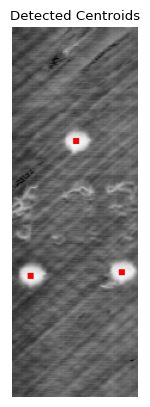

Detected centroids: [(91, 205), (53, 95), (15, 208)]


In [ ]:
# Example inputs
image = tiff.imread(
    r"C:\Users\jorge.cabrejas\Desktop\bin2mat ITEFI\P1P27_15MHZ_L_24E_17DB_RF_01_amplitude_16b.tif"
)
image = np.swapaxes(image, 0, 1)
image = np.swapaxes(image, 1, 2)
image = (image - image.min()) / (image.max() - image.min())
image = (image * 255).astype(np.uint8)
image = 255 - np.max(image, axis=2)

circle_diameter_mm = 5.0  # Circle diameter in mm
resolution_mm_per_pixel = 0.3  # Image resolution in mm/pixel

# Detect centroids of the holes
centroids = template_matching_find_holes(
    image, circle_diameter_mm, resolution_mm_per_pixel
)

# Paint the detected centroids on the image
output_image = paint_centroids_on_image(image, centroids)

# Display the results
import matplotlib.pyplot as plt

plt.imshow(output_image)
plt.title("Detected Centroids")
plt.axis("off")
plt.show()

# Print detected centroids
print("Detected centroids:", centroids)

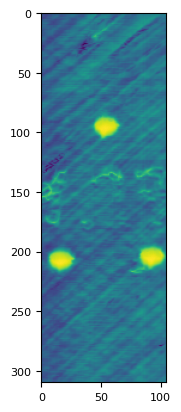

In [ ]:
plt.imshow(image)

In [ ]:
image.min(), image.max()

(np.uint8(0), np.uint8(250))

In [ ]:
5 / 0.3

16.666666666666668

In [ ]:
16.6 * 0.3, 19 * 0.3, 19 / 16

(4.98, 5.7, 1.1875)

In [ ]:
(19 / 16.6) * 0.3

0.34337349397590355

In [ ]:
str(0.3 * 0.35625) + " mm^2"

'0.106875 mm^2'

In [ ]:
0.3 / 0.35

0.8571428571428572

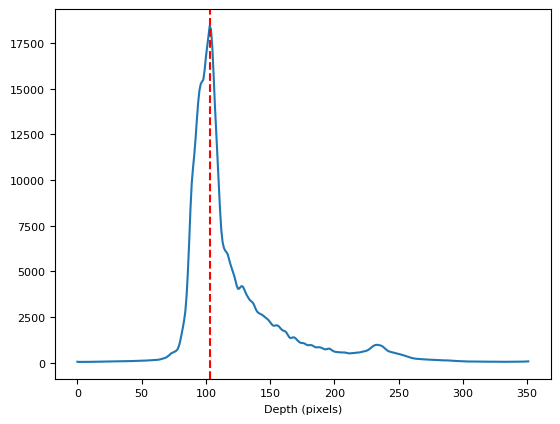

In [ ]:
image = tiff.imread(
    r"C:\Users\jorge.cabrejas\Desktop\bin2mat ITEFI\P1P27_15MHZ_L_24E_17DB_RF_01_amplitude_16b.tif"
)
mean_ascan = np.mean(image, axis=(1, 2))
plt.plot(range(mean_ascan.shape[0]), mean_ascan)
plt.xlabel("Depth (pixels)")
plt.axvline(np.argmax(mean_ascan), color="red", linestyle="--", label="Max intensity")

[(291, 85), (25, 77), (242, 66), (72, 58), (199, 88), (150, 59), (110, 0), (232, 52), (70, 60), (279, 49)]


IndexError: index 2 is out of bounds for axis 0 with size 2

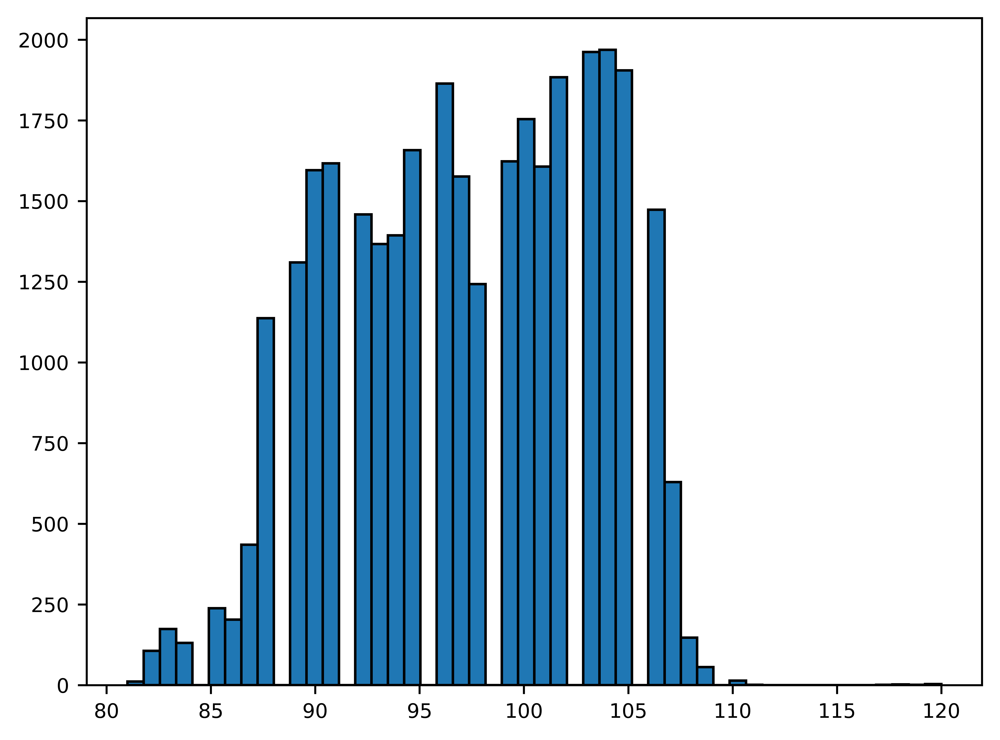

In [ ]:
from scipy.ndimage import gaussian_filter
import random

max_intensities = []
picked_signals = []
picked_smoothed_signals = []
# generate 10 random x, y pairs with x in [0, 310] and y in [0, 90]
random_points = [(random.randint(0, 310), random.randint(0, 90)) for _ in range(10)]
print(random_points)
for i in range(image.shape[1]):
    for j in range(image.shape[2]):
        signal = image[:, i, j]
        smoothed_signal = gaussian_filter(signal, sigma=2)
        if (i, j) in random_points or (j, i) in random_points:
            picked_signals.append(signal)
            picked_smoothed_signals.append(smoothed_signal)
        max_intensities.append(np.argmax(image[:, i, j]))


plt.hist(max_intensities, bins=50, edgecolor="black")
# plot 2 rows 5 columns plot of the picked signals plotting together the signal and the smoothed signal
fig, axs = plt.subplots(2, 5, figsize=(40, 20))
for i, (signal, smoothed_signal) in enumerate(
    zip(picked_signals, picked_smoothed_signals)
):
    ax = axs[i // 5, i % 5]
    ax.plot(signal, label="Signal")
    ax.plot(smoothed_signal, label="Smoothed Signal")
    ax.set_title(f"Point {random_points[i]}")
    ax.legend()
plt.show()

In [ ]:
max_intensities = np.array(max_intensities)
max_intensities.shape, max_intensities.mean(), max_intensities.std()

((32550,), np.float64(97.29256528417818), np.float64(6.004465570171286))

In [ ]:
volume = tiff.imread(
    r"C:\Users\jorge.cabrejas\Desktop\bin2mat ITEFI\P1P29_15MHZ_L_24E_17DB_RF_01_amplitude_16b_resized.tif"
)
zdim, ydim, xdim = volume.shape

# Define the target index where all maxima should be aligned


# Find the index of the maximum along the z-axis for each (y, x) position
max_indices = np.argmax(volume, axis=0)  # Shape: (ydim, xdim)
target_index = np.median(max_indices).astype(int)

# Calculate shifts needed to align maxima to the target index
shifts = target_index - max_indices  # Shape: (ydim, xdim)

# Initialize variables to determine the cropping bounds
min_start = 0
max_end = zdim

# Find cropping bounds based on the shortest signal after alignment
for y in range(ydim):
    for x in range(xdim):
        # Calculate the new start and end indices for the signal after shifting
        start = max(0, -shifts[y, x])
        end = min(zdim, zdim - shifts[y, x])

        # Update global bounds for cropping
        min_start = max(min_start, start)
        max_end = min(max_end, end)

# Crop and align the volume
aligned_cropped_volume = np.zeros((max_end - min_start, ydim, xdim), dtype=volume.dtype)

for y in range(ydim):
    for x in range(xdim):
        # Shift the signal and crop to the determined bounds
        shifted_signal = np.roll(volume[:, y, x], shifts[y, x])
        aligned_cropped_volume[:, y, x] = shifted_signal[min_start:max_end]

# Verify the result
print("Original volume shape:", volume.shape)
print("Aligned and cropped volume shape:", aligned_cropped_volume.shape)

# Check that all maxima are aligned to the target index within the cropped volume
aligned_max_indices = np.argmax(aligned_cropped_volume, axis=0)
print(
    "All maxima aligned to target index:",
    np.all(aligned_max_indices == target_index - min_start),
)

Original volume shape: (352, 310, 90)
Aligned and cropped volume shape: (336, 310, 90)
All maxima aligned to target index: True


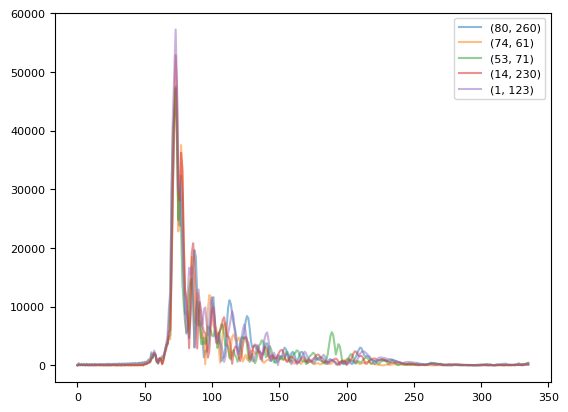

In [ ]:
tiff.imwrite("aligned_cropped_volume.tif", aligned_cropped_volume)
import random

for i in range(5):
    x, y = random.randint(0, xdim - 1), random.randint(0, ydim - 1)
    sns.lineplot(aligned_cropped_volume[:, y, x], label=f"({x}, {y})", alpha=0.5)